In [1]:
import numpy as np
import pandas as pd
import scipy
import random
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
from collections import defaultdict
import os

from tools import PatchForager

In [2]:
# Load the CSV file

filename = 'data/batch3_exp2.csv'
df = pd.read_csv(filename, index_col=0)

In [3]:
def load_and_organize_data(file_path):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Ensure 'mouse' and 'session' columns exist
    if 'mouse' not in df.columns or 'session' not in df.columns:
        raise ValueError("CSV must contain 'mouse' and 'session' columns")
    
    # Get variable names, excluding 'mouse' and 'session'
    variables = [col for col in df.columns if col not in ['mouse', 'session']]
    
    # Initialize a dictionary to store organized data
    organized_data = defaultdict(lambda: defaultdict(dict))
    
    # Group data by mouse and session
    grouped = df.groupby(['mouse', 'session'])
    
    # Iterate through each group
    for (mouse, session), group_data in grouped:
        for var in variables:
            # Convert to list, keeping NaN values
            data = group_data[var].tolist()
            organized_data[mouse][session][var] = data
    
    return organized_data

def plot_data(organized_data):
    for mouse, mouse_data in organized_data.items():
        for session, session_data in mouse_data.items():
            fig, axes = plt.subplots(len(session_data), 1, figsize=(10, 4*len(session_data)), sharex=True)
            fig.suptitle(f'Mouse {mouse}, Session {session}')
            
            if len(session_data) == 1:  # If there's only one variable, axes is not a list
                axes = [axes]
            
            for i, (var, data) in enumerate(session_data.items()):
                # Use numpy's nan_to_num to plot NaN values as gaps
                plotted_data = np.arange(len(data))
                axes[i].plot(plotted_data, np.nan_to_num(data, nan=np.nan),'.')
                axes[i].set_ylabel(var)
                axes[i].set_xlabel('Time' if i == len(session_data) - 1 else '')
            
            plt.tight_layout()
            plt.show()

In [68]:
for mouse, mouse_data in organized_data.items():
    for session, session_data in mouse_data.items():
        print(mouse,session)

707349 20240611
707349 20240612
707349 20240613
707349 20240614
707349 20240617
707349 20240618
707349 20240619
707349 20240620
707349 20240621
707349 20240624
707349 20240625
707349 20240626
707349 20240627
707349 20240628
713545 20240611
713545 20240612
713545 20240613
713545 20240614
713545 20240617
713545 20240618
713545 20240619
713545 20240620
713545 20240621
713545 20240624
713545 20240625
713545 20240626
713545 20240627
713545 20240628
713578 20240611
713578 20240612
713578 20240613
713578 20240614
713578 20240617
713578 20240618
713578 20240619
713578 20240620
713578 20240621
713578 20240624
713578 20240625
713578 20240626
713578 20240627
713578 20240628
715865 20240611
715865 20240612
715865 20240613
715865 20240614
715865 20240617
715865 20240618
715865 20240619
715865 20240620
715865 20240621
715865 20240624
715865 20240625
715865 20240626
715865 20240627
715865 20240628
715866 20240611
715866 20240612
715866 20240613
715866 20240614
715866 20240617
715866 20240618
715866 2

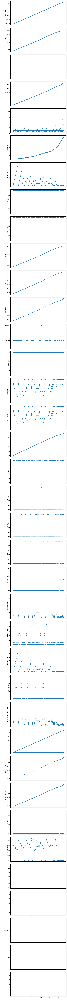

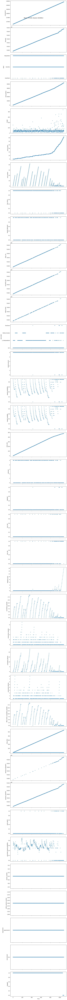

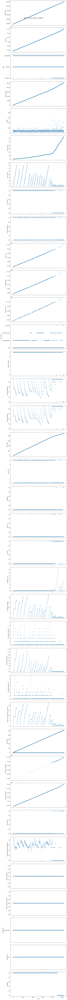

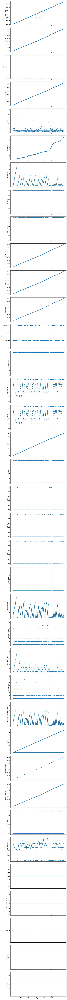

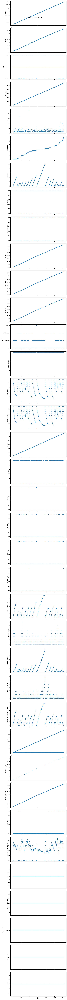

...

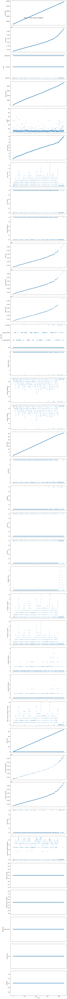

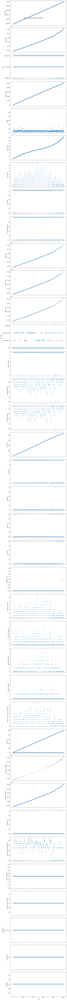

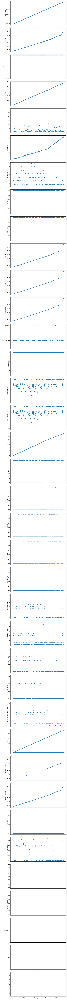

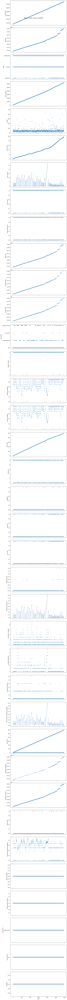

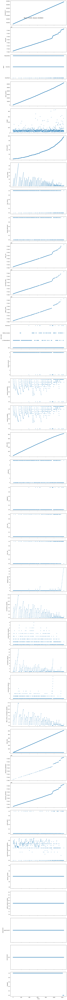

KeyboardInterrupt: 

In [4]:
# Usage example
organized_data = load_and_organize_data(filename)
plot_data(organized_data)

In [55]:
class SessionData:
    def __init__(self, data):
        self.df = pd.DataFrame(data)
        self.variables = ['visit_number', 'reward_probability', 'cumulative_rewards', 'cumulative_failures', 'consecutive_failures']
        
    def process_variables_at_visits(self):
        visit_mask = self.df['last_visit'] == 1
        result = pd.DataFrame(columns=self.variables + ['odor_label'])
        
        for var in self.variables + ['odor_label']:
            filled_series = self.df[var].ffill()
            result[var] = filled_series[visit_mask]
        
        return result
    
    def plot_variables_by_odor(self):
        visits_data = self.process_variables_at_visits()
        
        # Create a color map for odors
        unique_odors = visits_data['odor_label'].unique()
        color_map = plt.get_cmap('tab10')
        color_dict = {odor: color_map(i/len(unique_odors)) for i, odor in enumerate(unique_odors)}
        
        # Create the plot with subplots
        fig, axes = plt.subplots(1, len(self.variables), figsize=(12, 3), sharex=True)
        fig.suptitle('Variables at "Last Visit", Colored by Odor', fontsize=16)
        
        for i, var in enumerate(self.variables):
            ax = axes[i]
            for odor in unique_odors:
                odor_data = visits_data[visits_data['odor_label'] == odor]
                ax.scatter(odor_data.index, odor_data[var], 
                           c=[color_dict[odor]], label=odor, s=50)
            
            ax.set_ylabel(var.replace('_', ' ').title())
            ax.grid(True, linestyle='--', alpha=0.7)
            # ax.legend()
        
        axes[-1].set_xlabel('Visit Number')
        
        plt.tight_layout()
        plt.show()

    def plot_overall_reward_rate(self):
        # Calculate cumulative sum of collected rewards
        cumulative_rewards = self.df['collected'].cumsum()
        # print(cumulative_rewards)
        
        # Assuming each row represents a fixed time step, calculate total time
        total_time = np.arange(1, len(self.df) + 1)
        
        # Calculate reward rate
        reward_rate = cumulative_rewards / total_time
        
        # Create the plot
        plt.figure(figsize=(3, 2))
        plt.plot(total_time, reward_rate,'.')
        plt.xlabel('Time')
        plt.ylabel('Overall Reward Rate')
        # plt.title('Overall Reward Rate \n Throughout the Session')
        plt.grid(True, linestyle='--', alpha=0.7)
        
        # Add final reward rate annotation
        final_rate = reward_rate.iloc[-1]
        plt.annotate(f'Final Rate: {final_rate:.4f}', 
                     xy=(total_time[-1], final_rate),
                     xytext=(0.8, 0.95), textcoords='axes fraction',
                     arrowprops=dict(facecolor='black', shrink=0.05),
                     horizontalalignment='right', verticalalignment='top')
        
        plt.tight_layout()
        plt.show()

[707349, 20240611]


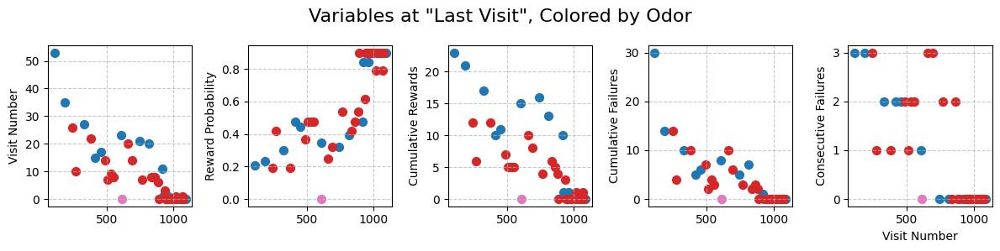

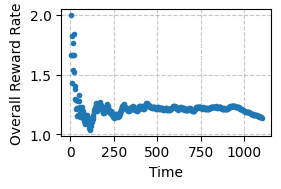

[707349, 20240612]


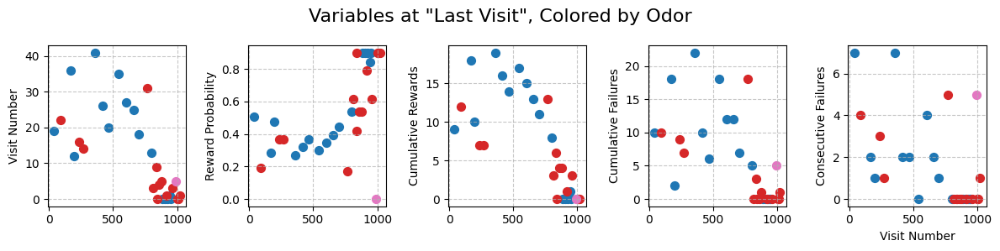

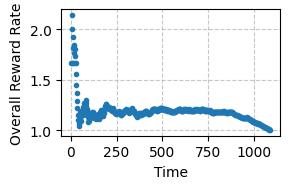

[707349, 20240613]


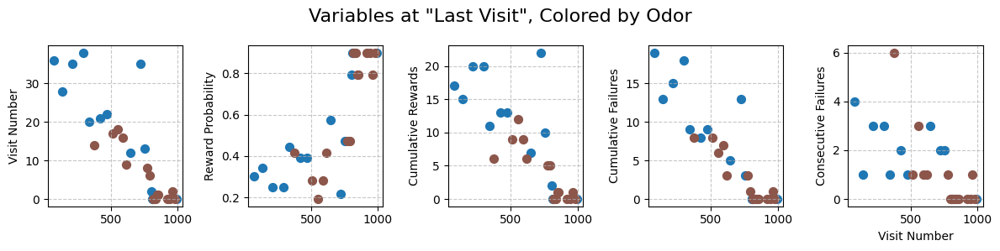

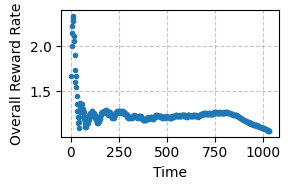

[707349, 20240614]


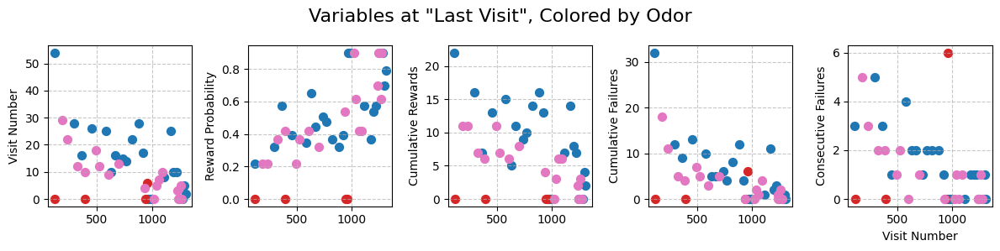

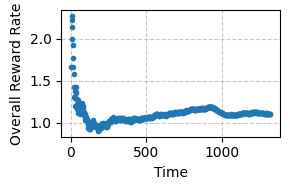

[707349, 20240617]


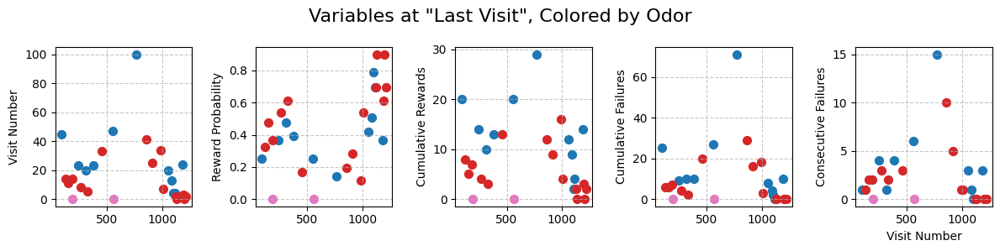

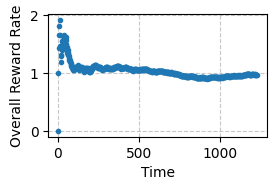

[707349, 20240618]


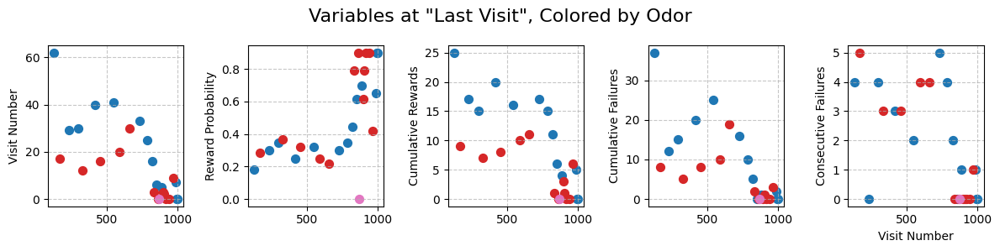

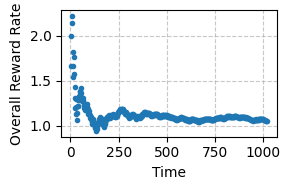

[707349, 20240619]


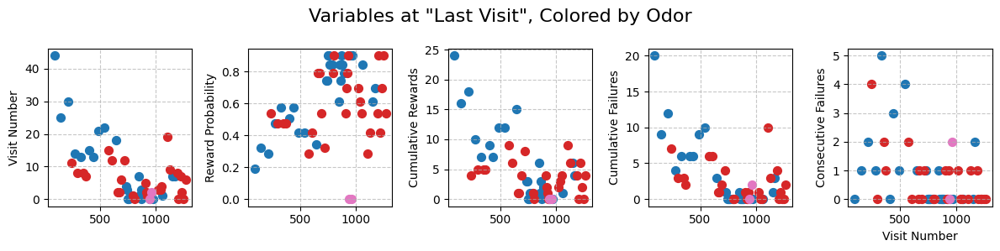

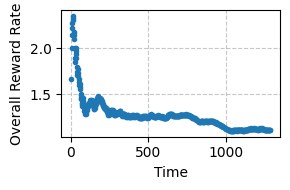

[707349, 20240620]


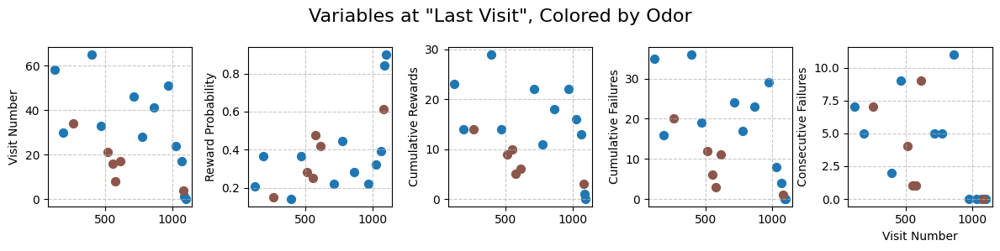

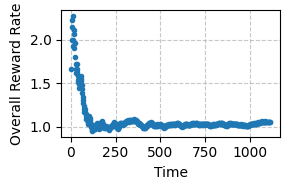

[707349, 20240621]


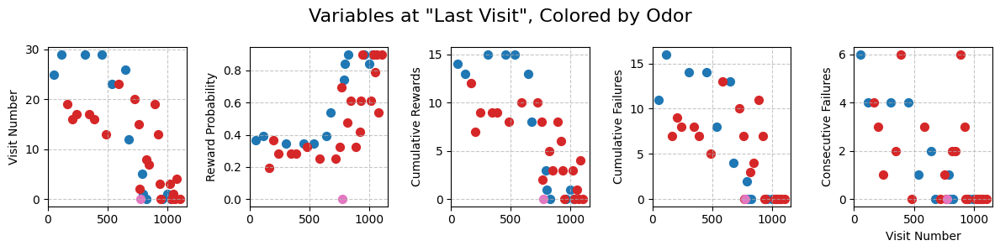

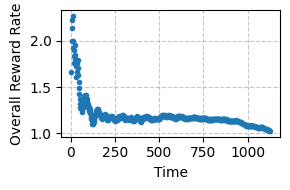

[707349, 20240624]


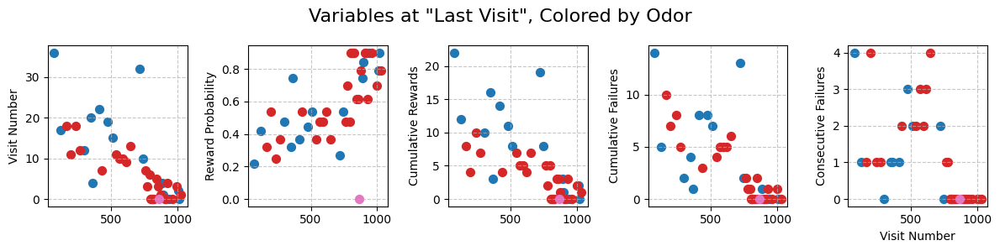

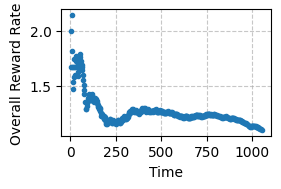

[707349, 20240625]


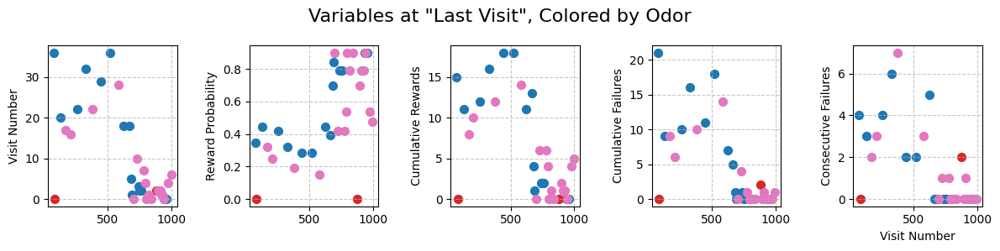

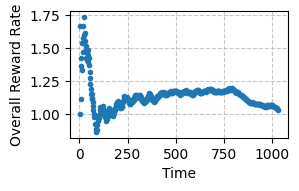

[707349, 20240626]


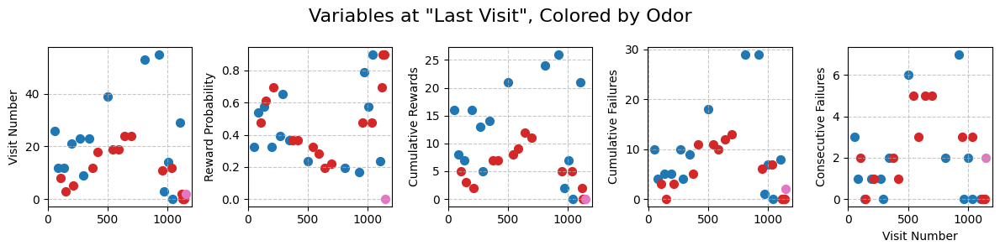

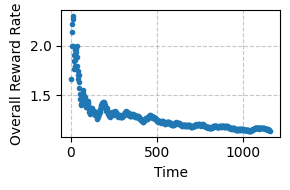

[707349, 20240627]


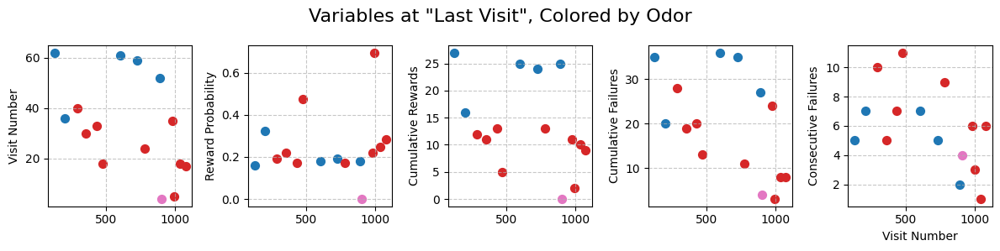

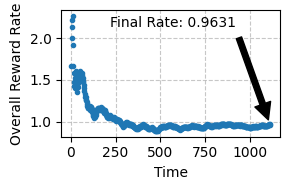

[707349, 20240628]


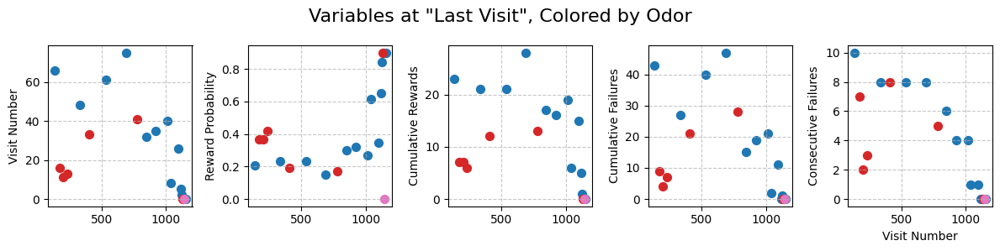

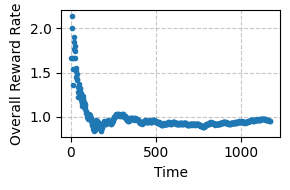

[707349, <__main__.SessionData object at 0x369dac190>]


KeyError: 'last_visit'

In [56]:
for mouse, mouse_data in organized_data.items():
        for si, session_data in mouse_data.items():
            print([mouse,si])
            session = SessionData(session_data)
            session.plot_variables_by_odor()
            session.plot_overall_reward_rate()